 # Imports

In [2]:
import numpy as np
import os
import matplotlib.pyplot as plt
import imageio
import corner_detection
import perspective_transform
import text_detection
import cv2

C:\Users\ahire\AppData\Local\Temp\ipykernel_16588\1093952834.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img1 = imageio.imread(file_img1)
C:\Users\ahire\AppData\Local\Temp\ipykernel_16588\1093952834.py:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img2 = imageio.imread(file_img2)


<Axes: >

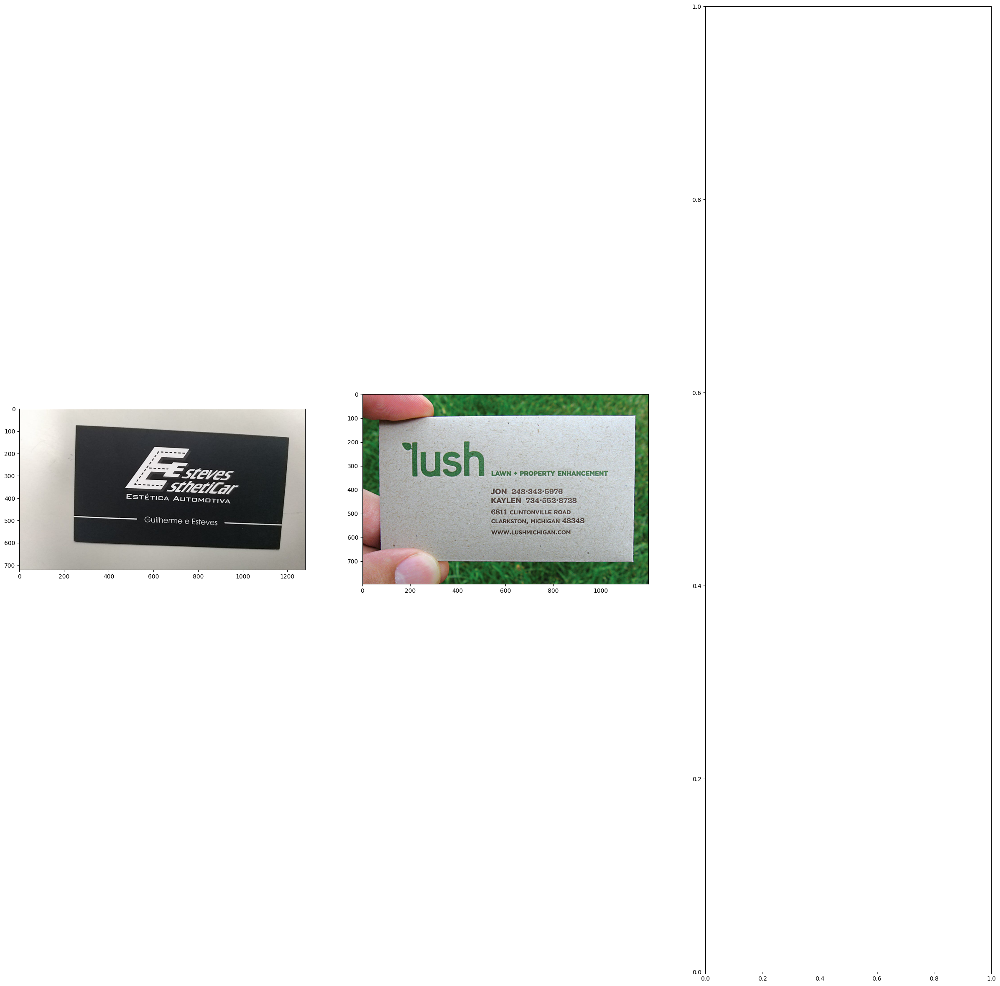

In [3]:
# Listing example files
example_files = [
    './images/' + f for f in os.listdir('./images')
    if os.path.isfile(os.path.join('./images', f))
]
# Selecting files for testing
file_img1 = './images/806123698_321554.jpg'
file_img2 = './images/ex2.png'
img1 = imageio.imread(file_img1)
img2 = imageio.imread(file_img2)
plt.figure(figsize=(30, 30))
plt.subplot(131)
plt.imshow(img1)
plt.subplot(132)
plt.imshow(img2)
plt.subplot(133)


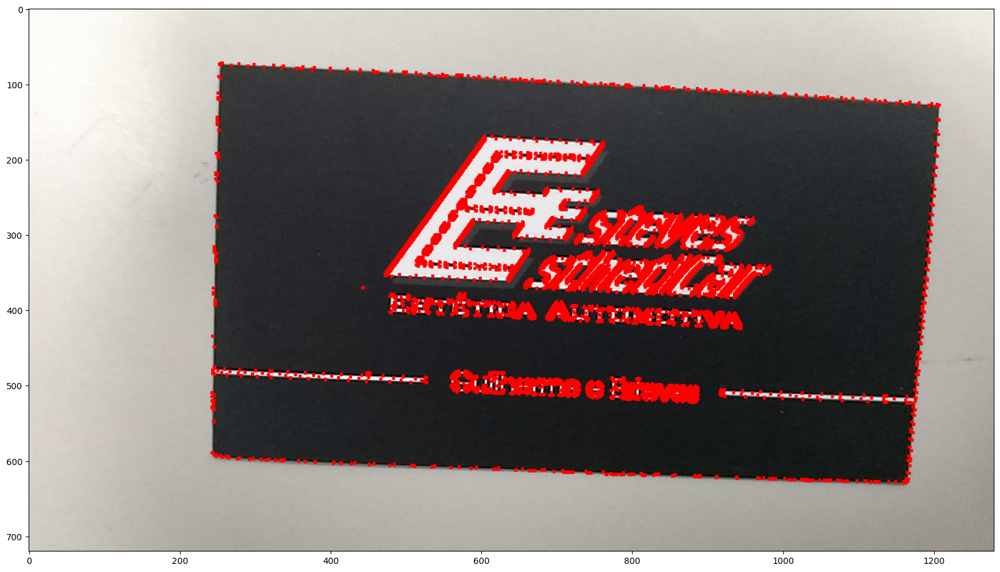

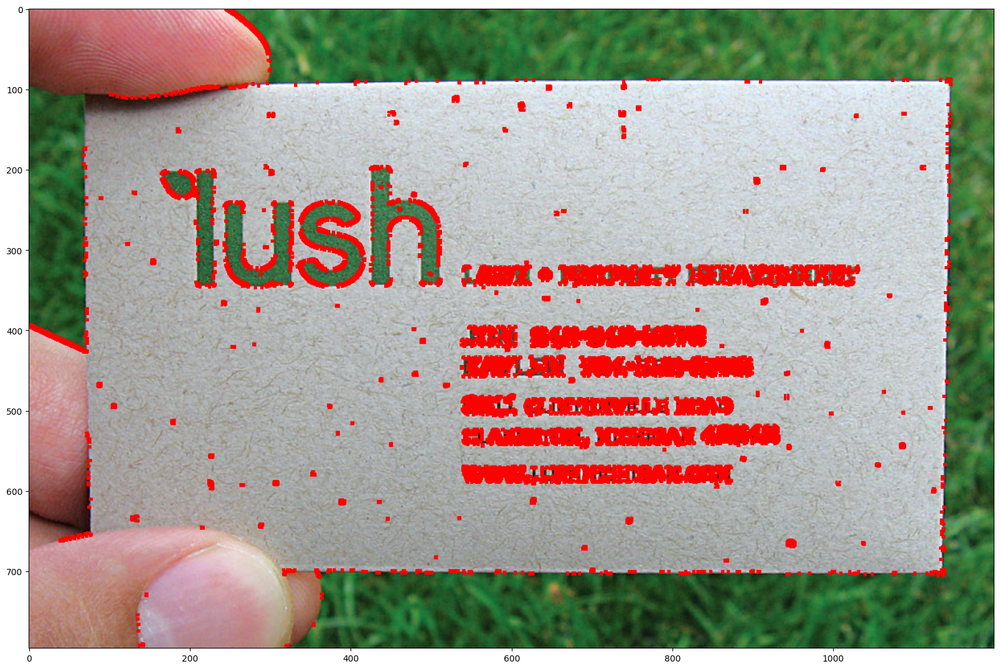

In [4]:
img1_corners = corner_detection.CornerDetector(img1).corner_detector()[0]
plt.figure(figsize=(20, 20))
plt.imshow(img1_corners)
plt.show()
img2_corners = corner_detection.CornerDetector(img2).corner_detector()[0]
plt.figure(figsize=(20, 20))
plt.imshow(img2_corners)
plt.show()


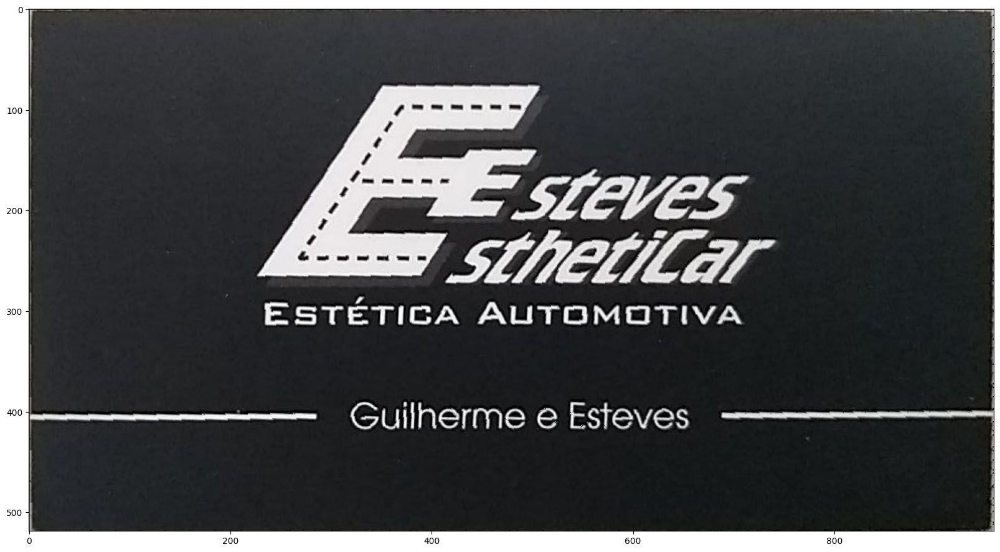

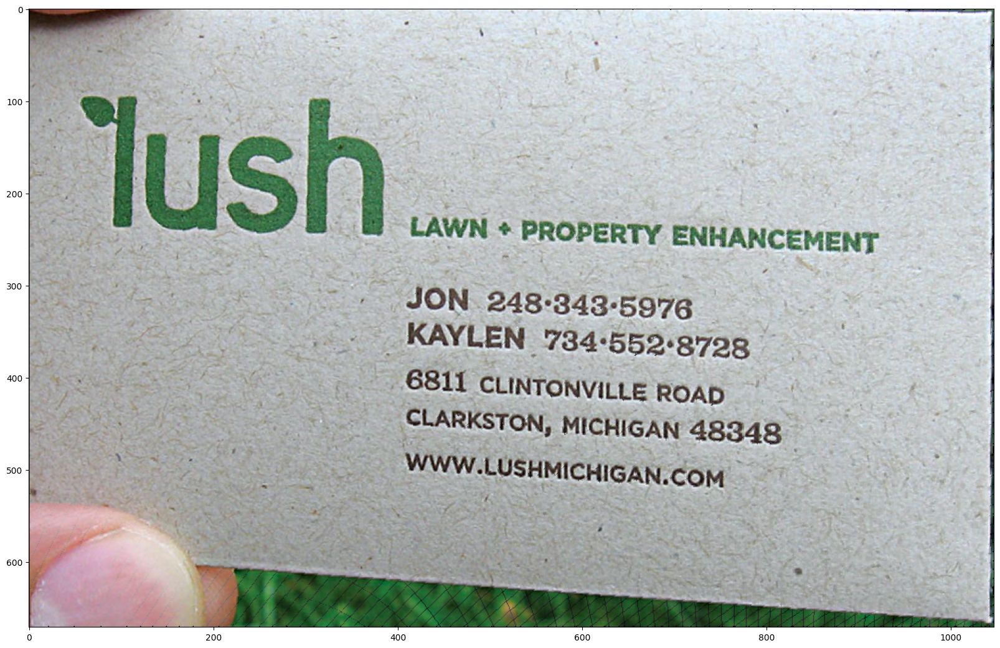

In [5]:
corner_points1 = corner_detection.CornerDetector(img1).find_corners4().astype(
    np.float32)
corner_points1[:, [0, 1]] = corner_points1[:, [1, 0]]
img1_t = perspective_transform.PerspectiveTransform(
    img1, corner_points1).four_point_transform()
plt.figure(figsize=(20, 20))
plt.imshow(img1_t)
plt.show()

corner_points2 = corner_detection.CornerDetector(img2).find_corners4().astype(
    np.float32)
corner_points2[:, [0, 1]] = corner_points2[:, [1, 0]]
img2_t = perspective_transform.PerspectiveTransform(
    img2, corner_points2).four_point_transform()
plt.figure(figsize=(20, 20))
plt.imshow(img2_t)
plt.show()



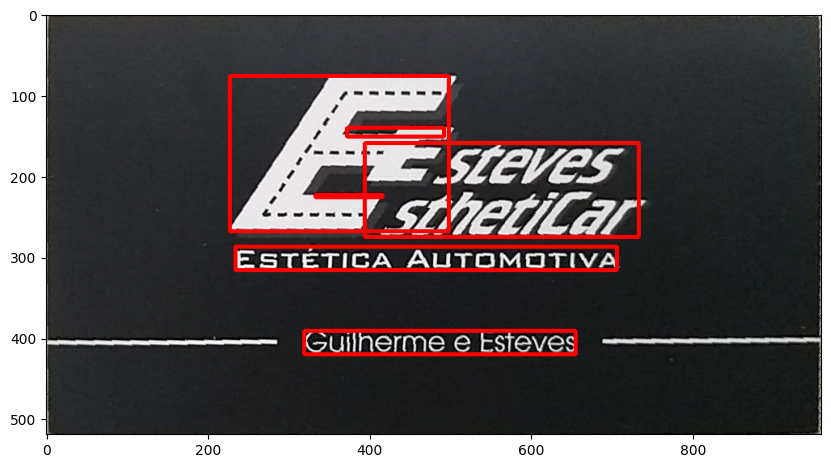

AttributeError: module 'text_detection' has no attribute 'find_text_pytesseract'

In [6]:
img1_t_cv = cv2.cvtColor(img1_t, cv2.COLOR_RGB2BGR)
text_detector = text_detection.TextDetector(img1_t_cv)  # Provide the image as an argument
bboxes1 = text_detector._TextDetector__detect_text((30, 10))  # Accessing private method

for box in bboxes1:
    x, y, w, h = box
    cv2.rectangle(img1_t_cv, (x, y), (x + w, y + h), (0, 0, 255), 3, 8, 0)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img1_t_cv, cv2.COLOR_BGR2RGB))
plt.show()

for box in bboxes1:
    x, y, w, h = box
    print(text_detection.find_text_pytesseract(img1_t[y:y + h + 1, x:x + w + 1]))

